In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import os
import json
import pandas as pd
import numpy  as np

import matplotlib.pyplot as plt
import matplotlib.dates  as mdates

from datetime   import datetime, timezone
from legendmeta import LegendMetadata

from itertools import cycle

lmeta = LegendMetadata('/Users/romoluque_c/Repositories/legend-metadata/')

In [3]:
run_dict = {'p03':{'r000':{},'r001':{},'r002':{},'r003':{},'r004':{},'r005':{}},
            'p04':{'r000':{},'r001':{},'r002':{},'r003':{}},
            'p06':{'r000':{},'r001':{},'r002':{},'r003':{},'r004':{},'r005':{}},
            'p07':{          'r001':{},'r002':{},'r003':{},'r004':{},'r005':{},'r006':{},'r007':{}}}
            #'p08':{          'r001':{},'r002':{},'r003':{},'r004':{},'r005':{},'r006':{}}}

In [4]:
data_path = '/Users/romoluque_c/LEGEND/Energy_scale_group/Partitioning/data_example/'

In [5]:
dt    = datetime(2023, 4, 22, 5, 54, 22, tzinfo=timezone.utc)
chmap = lmeta.hardware.configuration.channelmaps.on(dt)
channel_dict = {}
for channel_name, channel_data in chmap.items():
    try:
        channel_dict[channel_data['daq']['rawid']] = (lmeta.channelmap(dt)[channel_name].type,
                                                      channel_name,
                                                      lmeta.channelmap(dt)[channel_name].production['mass_in_g'],
                                                      lmeta.channelmap(dt)[channel_name].location  ['string'],
                                                      lmeta.channelmap(dt)[channel_name].location  ['position'])
    except:
        continue

In [6]:
channel_dict;

In [7]:
for key, value in channel_dict.items():
    if value[0]== 'icpc':
        print(key, value)
    #if value[3]== 1:
    #    print(key, value)

1104000 ('icpc', 'V02160A', 1750.0, 1, 1)
1104001 ('icpc', 'V02160B', 1719.0, 1, 2)
1104002 ('icpc', 'V05261B', 2393.0, 1, 3)
1104003 ('icpc', 'V05266A', 2073.0, 1, 4)
1104004 ('icpc', 'V05266B', 1988.0, 1, 5)
1104005 ('icpc', 'V05268B', 1791.0, 1, 6)
1105600 ('icpc', 'V05612A', 2201.0, 1, 7)
1105602 ('icpc', 'V07647A', 1893, 1, 8)
1105603 ('icpc', 'V07647B', 1779, 1, 9)
1108802 ('icpc', 'V00074A', 2073.0, 2, 7)
1108803 ('icpc', 'V04549A', 1943.0, 2, 8)
1108804 ('icpc', 'V07298B', 2085, 2, 9)
1115200 ('icpc', 'V01386A', 1510.9, 4, 8)
1115201 ('icpc', 'V01403A', 1422.5, 4, 9)
1115202 ('icpc', 'V01404A', 1548.5, 4, 10)
1115203 ('icpc', 'V01406A', 1382.6, 4, 11)
1115204 ('icpc', 'V01415A', 1596.2, 4, 12)
1116801 ('icpc', 'V08682B', 1517, 5, 1)
1116802 ('icpc', 'V08682A', 3340, 5, 2)
1116803 ('icpc', 'V09372A', 4046, 5, 3)
1116804 ('icpc', 'V09374A', 2648, 5, 4)
1116805 ('icpc', 'V09724A', 2643, 5, 5)
1118402 ('icpc', 'V02162B', 2480.0, 7, 1)
1118403 ('icpc', 'V02166B', 2634.0, 7, 2)
11184

In [8]:
def cal_energy(e_uncal, cal_pars):
    if len(cal_pars.keys())==2:
        #print('lin')
        return cal_pars['a'] * e_uncal + cal_pars['b'], 'lin'
    elif len(cal_pars.keys())==3:
        #print('quad')
        return cal_pars['a'] * e_uncal **2 + cal_pars['b'] * e_uncal + cal_pars['c'], 'quad'

In [9]:
def uncal_quad(e_cal, cal_pars):
    return (-cal_pars['b']+np.sqrt(cal_pars['b']**2-2*cal_pars['a']*(cal_pars['c']-e_cal)))/(2*cal_pars['a'])

### Let's choose all the ICPC detectors

In [10]:
all_params_ch = {}
all_channels  = ['ch1104000', 'ch1104001', 'ch1104002', 'ch1104003', 'ch1104004', 'ch1104005', 'ch1105600',
                 'ch1105602', 'ch1105603', 'ch1108802', 'ch1108803', 'ch1108804', 'ch1115200', 'ch1115201',
                 'ch1115202', 'ch1115203', 'ch1115204', 'ch1116801', 'ch1116802', 'ch1116803', 'ch1116804',
                 'ch1116805', 'ch1118402', 'ch1118403', 'ch1118404', 'ch1118405', 'ch1120000', 'ch1120001',
                 'ch1120002', 'ch1121600', 'ch1121601', 'ch1121602', 'ch1121603', 'ch1121604', 'ch1121605',
                 'ch1078400', 'ch1084803', 'ch1084804', 'ch1084805', 'ch1086400', 'ch1086401']

err_channels = []
for sel_channel in all_channels:
    
    pars_per_ch = {'mus_peaks':        {}, 'mus_err_peaks':   {},
                   'fwhms_peaks':      {}, 'fwhms_err_peaks': {},
                   'ecals_peaks':      {},
                   'Qbb_fwhms_in_keV': [], 'Qbb_fwhms_err_in_keV': [],
                   'eres_lin_pars0':   [], 'eres_lin_pars0_err':   [],
                   'eres_lin_pars1':   [], 'eres_lin_pars1_err':   [],
                   'gains':            [], 'Qbb_fwhms_in_ADC':     []}
    
    for i, period in enumerate(run_dict.keys()):
        for j, run in enumerate(run_dict[period].keys()):
            all_files = os.listdir(data_path)
            filename  = data_path + [f for f in all_files if f.startswith(f'l200-{period}-{run}')][0]
            with open (filename, 'r') as filehandler:
                try:
                    results   = json.load(filehandler)
                    res_chn   = results[sel_channel]['results']['ecal']
        
                    ## Parameters for calibration
                    cal_parameters = results[sel_channel]['pars']['operations']['cuspEmax_ctc_cal']['parameters']
                    
                    ## Parameters for resolution curve
                    eres_lin_pars = res_chn['cuspEmax_ctc_cal']['eres_linear']
    
                    pars_per_ch['Qbb_fwhms_in_keV']    .append({f'{period}-{run}': eres_lin_pars['Qbb_fwhm_in_keV']})
                    pars_per_ch['Qbb_fwhms_err_in_keV'].append({f'{period}-{run}': eres_lin_pars['Qbb_fwhm_err_in_keV']})
                    pars_per_ch['eres_lin_pars0']      .append({f'{period}-{run}': eres_lin_pars['parameters']   ['a']})
                    pars_per_ch['eres_lin_pars0_err']  .append({f'{period}-{run}': eres_lin_pars['uncertainties']['a']})
                    pars_per_ch['eres_lin_pars1']      .append({f'{period}-{run}': eres_lin_pars['parameters']   ['b']})
                    pars_per_ch['eres_lin_pars1_err']  .append({f'{period}-{run}': eres_lin_pars['uncertainties']['b']})
                    pars_per_ch['gains']               .append({f'{period}-{run}': cal_parameters['b']})
                    pars_per_ch['Qbb_fwhms_in_ADC']    .append({f'{period}-{run}': uncal_quad(eres_lin_pars['Qbb_fwhm_in_keV'], cal_parameters)})
                    
                    fitted_peaks   = res_chn['cuspEmax_ctc_cal']['fitted_peaks']
                    peak_fits_pars = res_chn['cuspEmax_ctc_cal']['pk_fits']
                    
                    for peak in fitted_peaks:
                        if i==0 and j==0:
                            pars_per_ch['mus_peaks']      [peak] = {}
                            pars_per_ch['mus_err_peaks']  [peak] = {}
                            pars_per_ch['fwhms_peaks']    [peak] = {}
                            pars_per_ch['fwhms_err_peaks'][peak] = {}
                            pars_per_ch['ecals_peaks']    [peak] = {}
                            
                        pars_per_ch['mus_peaks']      [peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['parameters_in_ADC']   ['mu']
                        pars_per_ch['mus_err_peaks']  [peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['uncertainties_in_ADC']['mu']
                        pars_per_ch['fwhms_peaks']    [peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['fwhm_in_keV']         [0]   
                        pars_per_ch['fwhms_err_peaks'][peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['fwhm_in_keV']         [1]   
                        pars_per_ch['ecals_peaks']    [peak][f'{period}-{run}'] = cal_energy(peak_fits_pars[f'{peak}']['parameters_in_ADC']['mu'], cal_parameters)[0]
                except:
                    print(sel_channel, period, run)
                    err_channels.append(sel_channel)
                    continue

    all_params_ch[sel_channel] = pars_per_ch

ch1108804 p03 r000
ch1108804 p03 r001
ch1108804 p03 r002
ch1108804 p03 r003
ch1108804 p03 r004
ch1108804 p03 r005
ch1108804 p04 r000
ch1108804 p04 r001
ch1108804 p04 r002
ch1108804 p04 r003
ch1108804 p06 r000
ch1108804 p06 r001
ch1108804 p06 r002
ch1108804 p06 r003
ch1108804 p06 r004
ch1108804 p06 r005
ch1108804 p07 r001
ch1108804 p07 r002
ch1108804 p07 r003
ch1108804 p07 r004
ch1108804 p07 r005
ch1108804 p07 r006
ch1108804 p07 r007
ch1115200 p03 r000
ch1115200 p03 r001
ch1115200 p03 r002
ch1115200 p03 r003
ch1115200 p03 r004
ch1115200 p03 r005
ch1115200 p04 r000
ch1115200 p04 r001
ch1115200 p04 r002
ch1115200 p04 r003
ch1115200 p06 r000
ch1115200 p06 r001
ch1115200 p06 r002
ch1115200 p06 r003
ch1115200 p06 r004
ch1115200 p06 r005
ch1115200 p07 r001
ch1115200 p07 r002
ch1115200 p07 r003
ch1115200 p07 r004
ch1115200 p07 r005
ch1115200 p07 r006
ch1115200 p07 r007
ch1115201 p03 r000
ch1115201 p03 r001
ch1115201 p03 r002
ch1115201 p03 r003
ch1115201 p03 r004
ch1115201 p03 r005
ch1115201 p0

In [11]:
from collections import Counter

counted_values = Counter(err_channels)
for value, count in counted_values.items():
    print(f"{value}: {count} times")

ch1108804: 23 times
ch1115200: 23 times
ch1115201: 23 times
ch1115202: 23 times
ch1115203: 2 times
ch1115204: 15 times
ch1121603: 19 times


In [12]:
labels = [f'{key}-{run}' for key in run_dict.keys() for run in run_dict[key].keys()]

### Position of the different peaks

In [13]:
all_fitted_peaks = np.array([583.191, 727.33, 860.564, 1592.53, 1620.5, 2103.53, 2614.5])

In [14]:
len(all_params_ch), np.round(len(all_params_ch)/3), int(np.ceil(len(all_params_ch)/3))

(41, 14.0, 14)

ch1108804 583.191
ch1115200 583.191
ch1115201 583.191
ch1115202 583.191


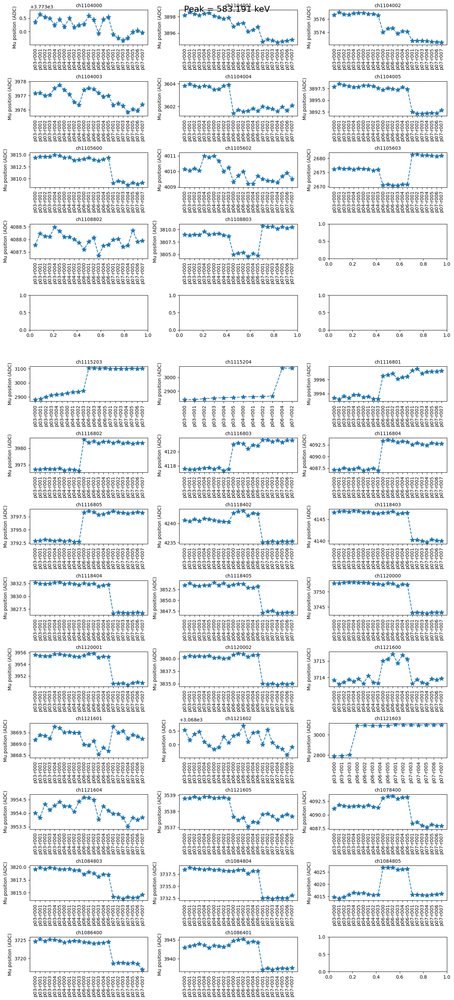


-------------------------------------------------------------------------------------------------

ch1108804 2103.53
ch1115200 2103.53
ch1115201 2103.53
ch1115202 2103.53


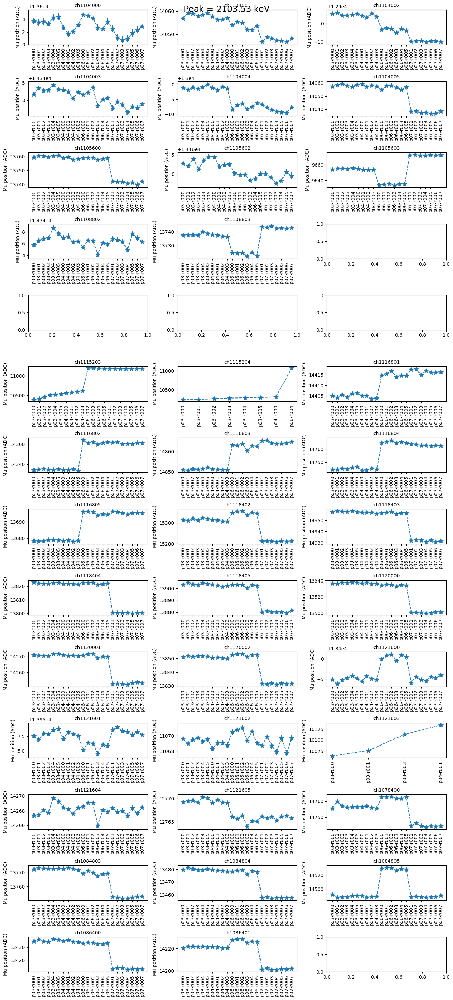


-------------------------------------------------------------------------------------------------

ch1108804 2614.5
ch1115200 2614.5
ch1115201 2614.5
ch1115202 2614.5
ch1115204 2614.5
ch1121603 2614.5


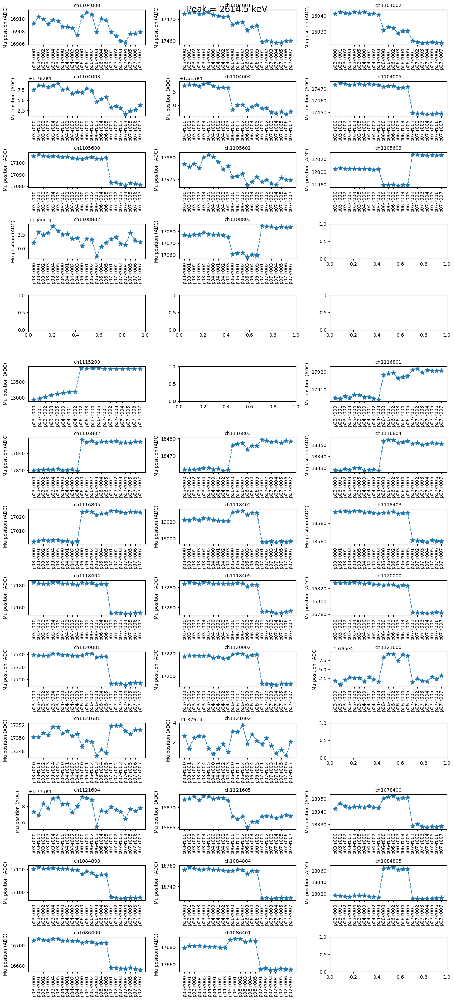


-------------------------------------------------------------------------------------------------



In [15]:
for peak in [all_fitted_peaks[0], all_fitted_peaks[5], all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                        list(all_params_ch[channel]['mus_peaks'][peak].values()),
                        yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                        marker='*', linestyle='--', markersize=10, label=channel)
            ax.tick_params(axis='x', labelsize=10, rotation=90)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_title(channel, fontsize=10)
            ax.set_ylabel('Mu position (ADC)', fontsize=10)
        except KeyError:
            print(channel, peak)
            continue
    fig.suptitle(f'Peak = {peak} keV', fontsize=18)
    plt.tight_layout()
    plt.show()
    print()
    print('-------------------------------------------------------------------------------------------------')
    print()

ch1108804 2614.5
ch1115200 2614.5
ch1115201 2614.5
ch1115202 2614.5
ch1115204 2614.5
ch1121603 2614.5


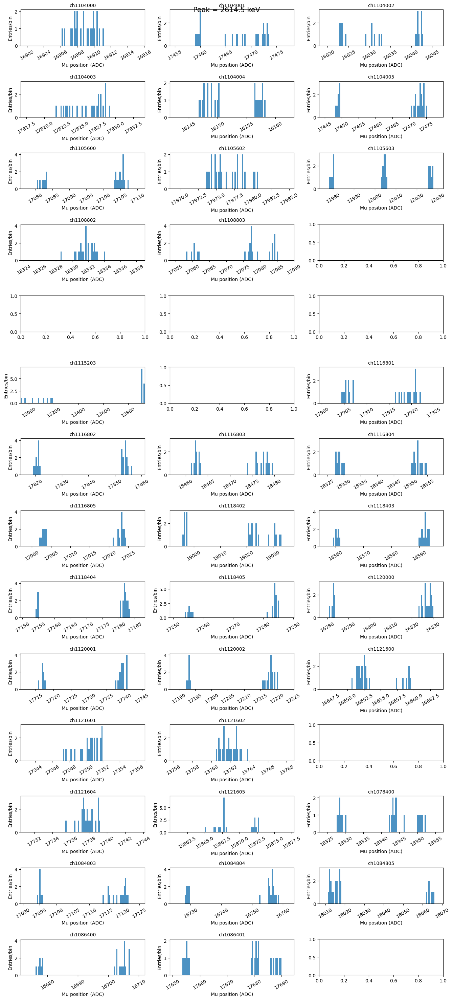

In [16]:
for peak in [all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.hist(list(all_params_ch[channel]['mus_peaks'][peak].values()), bins=100, label=channel, alpha=0.8,
                   range=(min(list(all_params_ch[channel]['mus_peaks'][peak].values()))-5,
                          max(list(all_params_ch[channel]['mus_peaks'][peak].values()))+5))
            ax.tick_params(axis='x', labelsize=10, rotation=30)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_xlim(min(list(all_params_ch[channel]['mus_peaks'][peak].values()))-5,
                        max(list(all_params_ch[channel]['mus_peaks'][peak].values()))+5)
            ax.set_title(channel, fontsize=10)
            ax.set_xlabel('Mu position (ADC)', fontsize=10)
            ax.set_ylabel('Entries/bin', fontsize=10)
        except KeyError:
            print(channel, peak)
            continue
    fig.suptitle(f'Peak = {peak} keV', fontsize=15)
    plt.tight_layout()
    plt.show()

### FEP FWHM for all the peaks

ch1108804 2614.5
ch1115200 2614.5
ch1115201 2614.5
ch1115202 2614.5
ch1115204 2614.5
ch1121603 2614.5


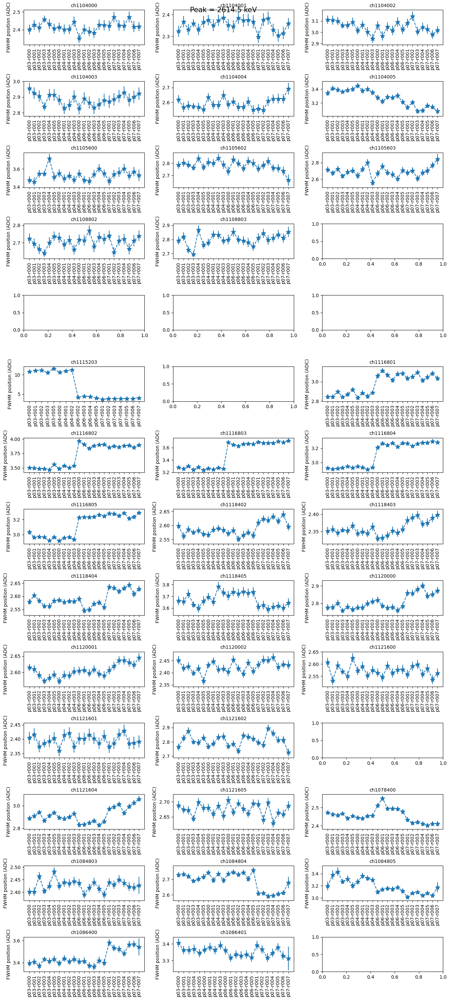

In [17]:
for peak in [all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.errorbar(list(all_params_ch[channel]['fwhms_peaks'][peak].keys()), 
                        list(all_params_ch[channel]['fwhms_peaks'][peak].values()),
                        yerr=list(all_params_ch[channel]['fwhms_err_peaks'][peak].values()),
                        marker='*', linestyle='--', markersize=10, label=channel)
            ax.tick_params(axis='x', labelsize=10, rotation=90)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_title(channel, fontsize=10)
            ax.set_ylabel('FWHM position (ADC)', fontsize=10)
        except KeyError:
            print(channel, peak)
            continue
    fig.suptitle(f'Peak = {peak} keV', fontsize=15)
    plt.tight_layout()
    plt.show()

### Qbb res

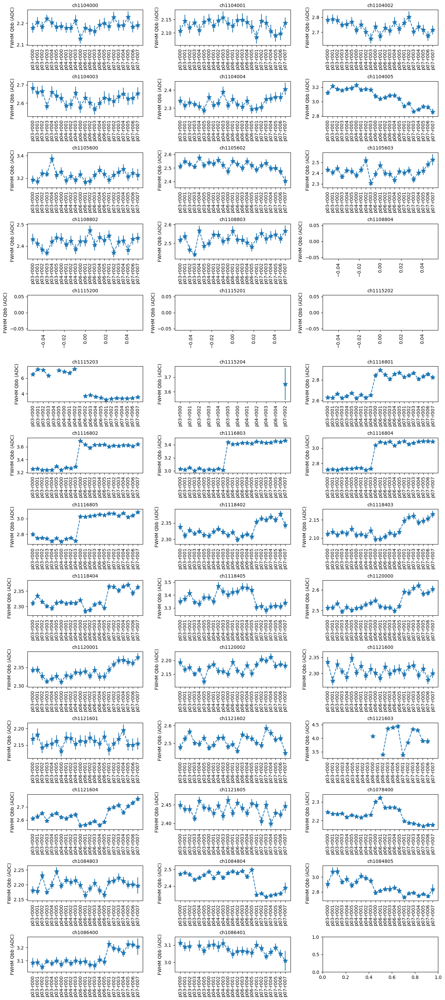

In [18]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                    [list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                    yerr=[list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_err_in_keV']],
                    marker='*', linestyle='--', markersize=10, label=channel)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(channel, fontsize=10)
        ax.set_ylabel('FWHM Qbb (ADC)', fontsize=10)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

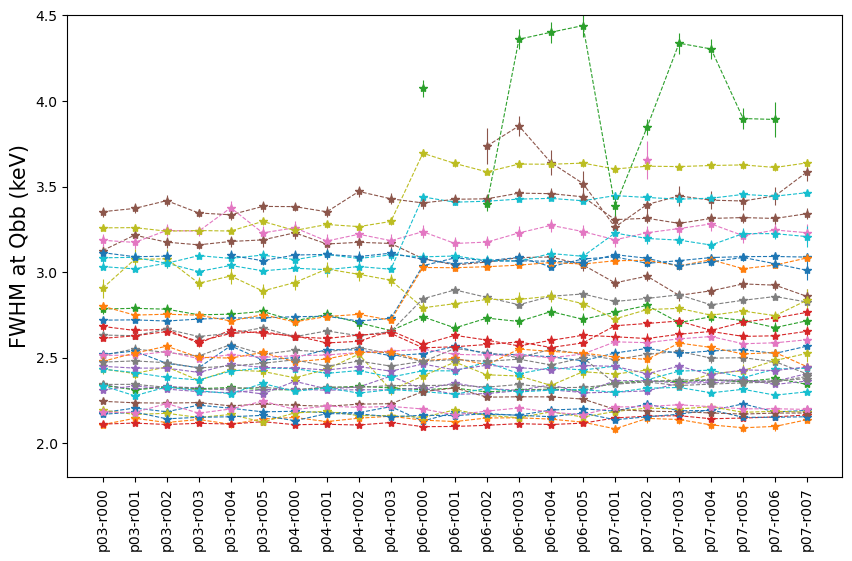

In [19]:
fig = plt.figure(figsize=(10, 6))
for channel in all_params_ch.keys():
    plt.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                 [list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                 yerr=[list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_err_in_keV']],
                 marker='*', linestyle='--', markersize=6, label=channel, linewidth=0.8)
plt.xticks(rotation=90)
plt.ylabel('FWHM at Qbb (keV)', fontsize=15)
plt.ylim(1.8, 4.5)
#plt.legend(fontsize=12, ncol=2)
plt.show()

### Gain

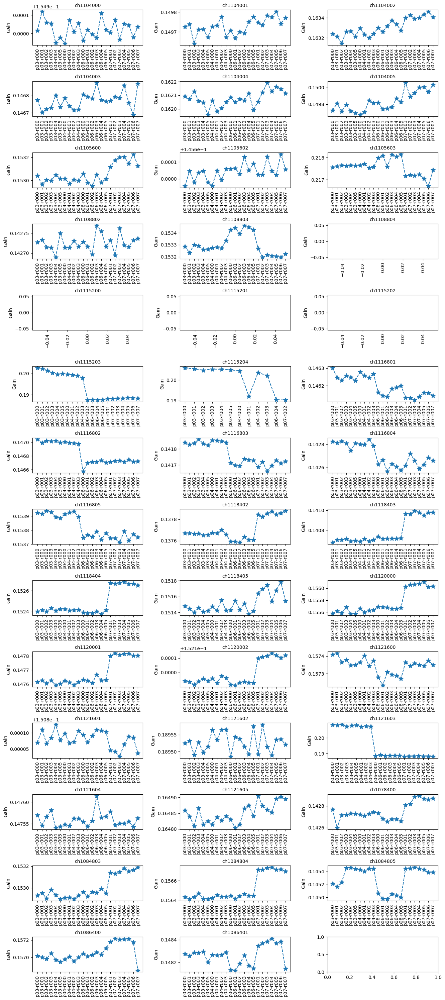

In [20]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['gains']],
                [list(i.values())[0] for i in all_params_ch[channel]['gains']],
                 marker='*', linestyle='--', markersize=10, label=f'Channel {channel}')
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(channel, fontsize=10)
        ax.set_ylabel('Gain', fontsize=10)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

### Residuals

ch1108804
ch1115200
ch1115201
ch1115202
ch1115204
ch1121603


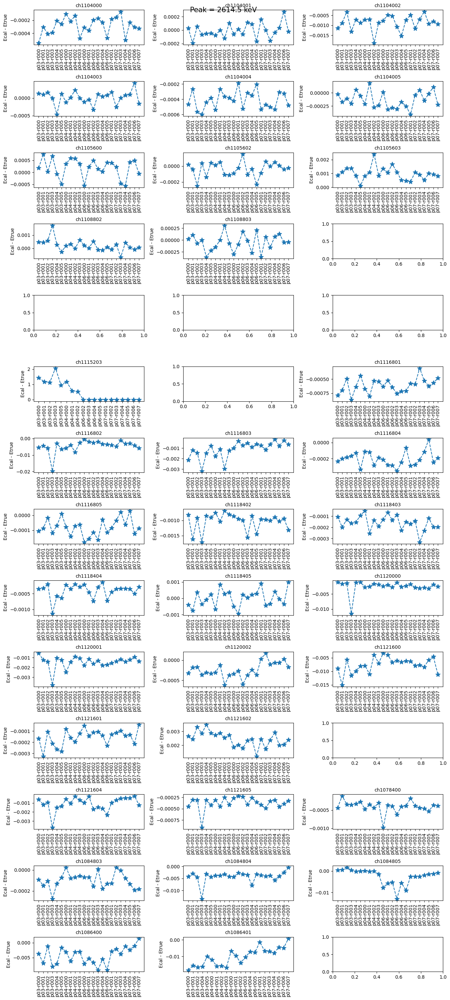

In [21]:
for peak in [all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.errorbar(list(all_params_ch[channel]['ecals_peaks'][peak].keys()), 
                        np.array(list(all_params_ch[channel]['ecals_peaks'][peak].values())) - peak,
                        marker='*', linestyle='--', markersize=10, label=channel)
            ax.tick_params(axis='x', labelsize=10, rotation=90)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_title(channel, fontsize=10)
            ax.set_ylabel('Ecal - Etrue', fontsize=10)
            fig.suptitle(f'Peak = {peak} keV', fontsize=15)
        except KeyError:
            print(channel)
            continue
    plt.tight_layout()
    plt.show()

ch1108804
ch1115200
ch1115201
ch1115202
ch1115204
ch1121603


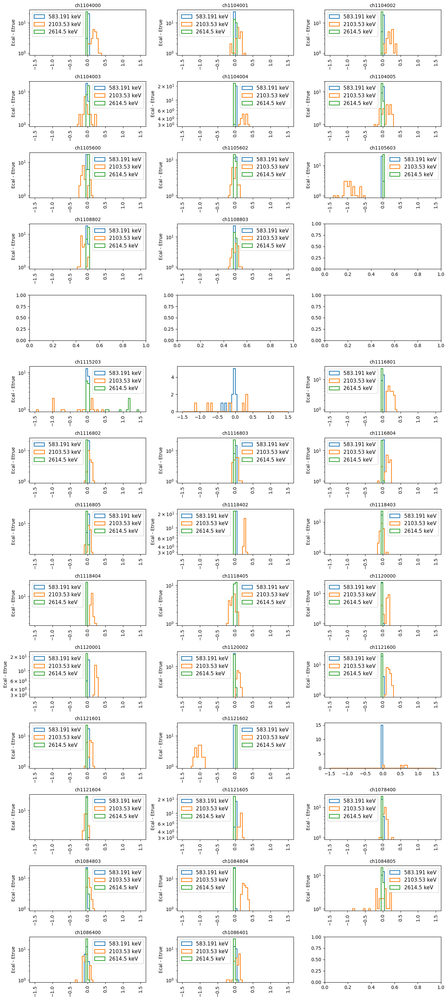

In [22]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        for peak in [all_fitted_peaks[0], all_fitted_peaks[5], all_fitted_peaks[6]]:
            ax.hist(np.array(list(all_params_ch[channel]['ecals_peaks'][peak].values())) - peak, bins=60, range=(-1.5, 1.5), histtype='step', linewidth=1.5, label=f'{peak} keV')
                
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(channel, fontsize=10)
        ax.set_ylabel('Ecal - Etrue', fontsize=10)
        #ax.set_xlim(-0.5, 0.5)
        ax.set_yscale('log')
        ax.legend(fontsize=11)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

ch1108804
ch1115200
ch1115201
ch1115202
ch1115204
ch1121603


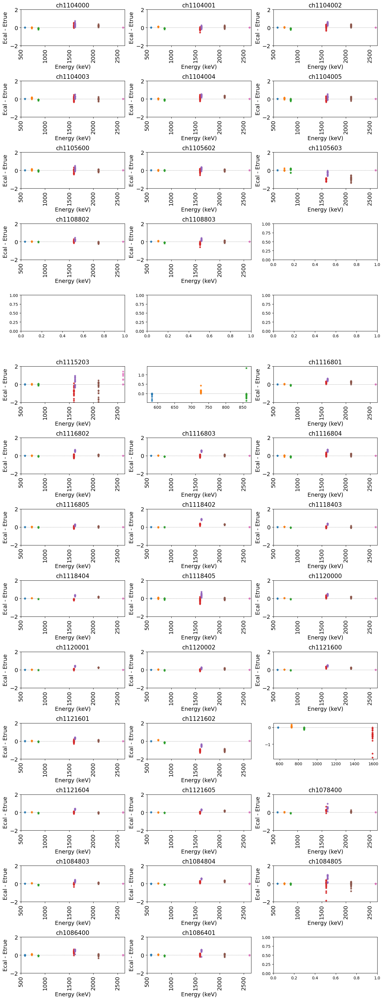

In [23]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 35))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax.axhline(y=0, linestyle='--', linewidth=0.5, color='grey')
        for i, peak in enumerate(all_fitted_peaks):
            ax.scatter(np.full(len(all_params_ch[channel]['ecals_peaks'][peak].values()), peak), np.array(list(all_params_ch[channel]['ecals_peaks'][peak].values())) - peak, marker='*', s=20)
        ax.tick_params(axis='x', labelsize=14, rotation=90)
        ax.tick_params(axis='y', labelsize=14)
        ax.set_xlabel('Energy (keV)', fontsize=14)
        ax.set_ylabel('Ecal - Etrue', fontsize=14)
        ax.set_title(channel, fontsize=15)
        ax.set_xlim(500, 2650)
        ax.set_ylim(-2, 2)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

### Gain and mu position

ch1108804
ch1115200
ch1115201
ch1115202
ch1115204
ch1121603


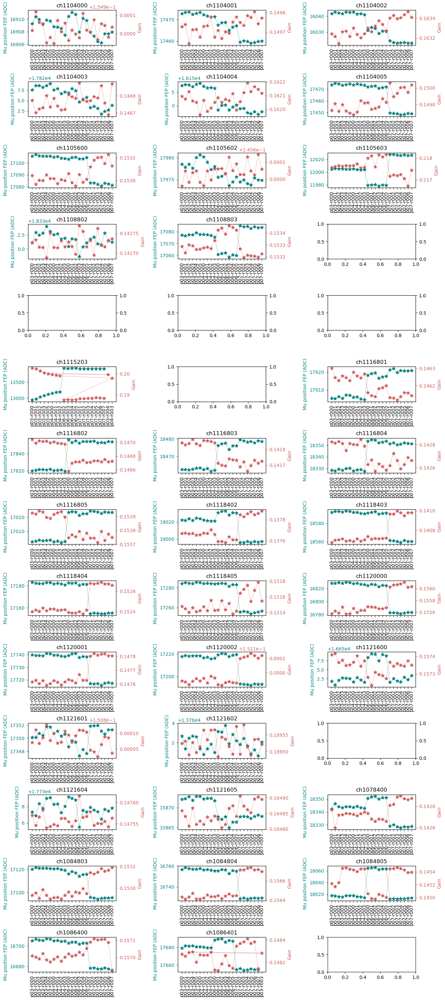

In [24]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax2 = ax.twinx()
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][2614.5].keys()), 
                     list(all_params_ch[channel]['mus_peaks'][2614.5].values()),
                     yerr=list(all_params_ch[channel]['mus_err_peaks'][2614.5].values()), 
                     marker='*', linestyle='--', markersize=8, label=channel, color='teal', linewidth=0.5)
        
        ax2.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['gains']],
                    [list(i.values())[0] for i in all_params_ch[channel]['gains']],
                     marker='*', linestyle='--', markersize=8, label=f'Channel {channel}', color='indianred', linewidth=0.5)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params( axis='y', labelsize=10, colors='teal')
        ax2.set_ylabel('Gain', color='indianred')
        ax2.tick_params(axis='y', labelsize=10, colors='indianred')
        
        
        ax.set_ylabel('Mu position FEP (ADC)', color='teal')
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.set_title(channel)
        #ax.set_ylim(0.146, 0.16)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

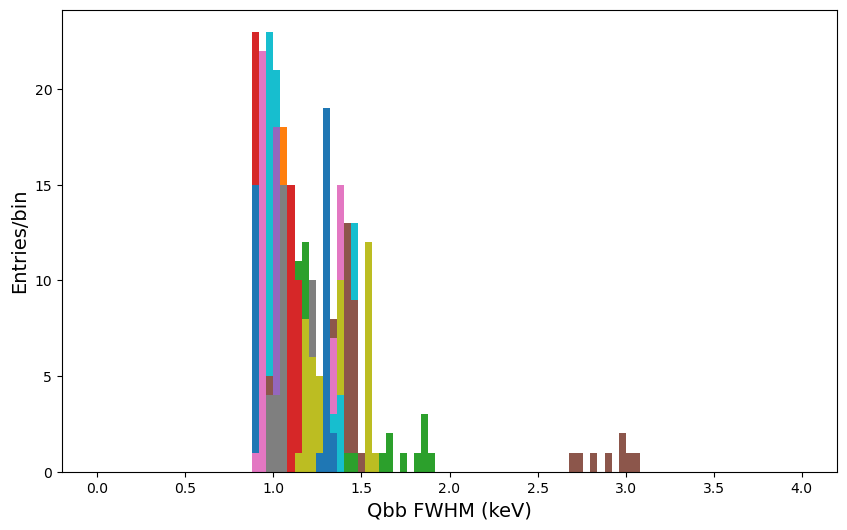

In [25]:
fig = plt.figure(figsize=(10, 6))
for channel in all_params_ch.keys():
    Qbb_fwhm_ch   = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_keV']])
    Qbb_fwhm_keys = np.array([list(el.keys  ())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_keV']])
    plt.hist(Qbb_fwhm_ch/2.355, bins=100, range=(0, 4), label=channel+f', $\sigma$ = {np.round(np.mean(Qbb_fwhm_ch/2.355), decimals=2)} keV')
plt.xlabel('Qbb FWHM (keV)', fontsize=14)
plt.ylabel('Entries/bin', fontsize=14)
plt.show()

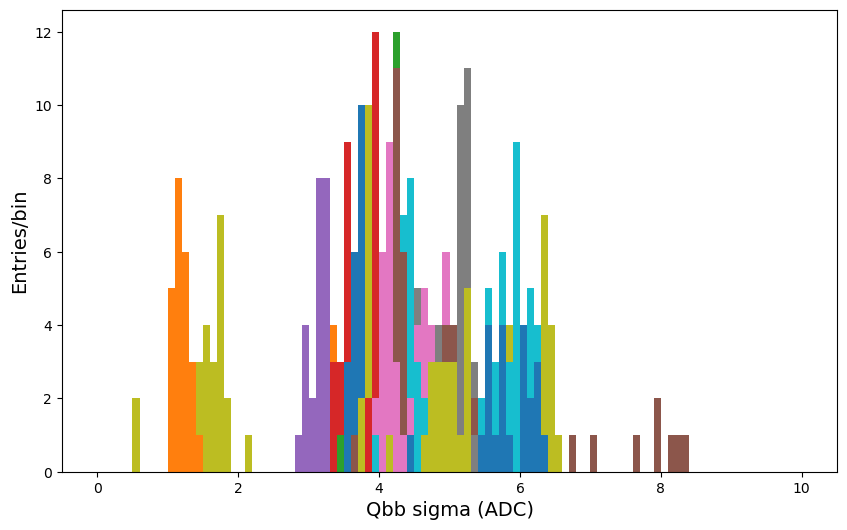

In [26]:
fig = plt.figure(figsize=(10, 6))
for channel in all_params_ch.keys():
    Qbb_fwhm_uncal = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])
    Qbb_sig_uncal  = Qbb_fwhm_uncal/2.355
    plt.hist(Qbb_sig_uncal, bins=100, range=(0, 10), label=channel)
plt.xlabel('Qbb sigma (ADC)', fontsize=14)
plt.ylabel('Entries/bin', fontsize=14)
#plt.legend(fontsize=12)
plt.show()

In [27]:
def compute_and_plot_partition(channel, peak, col='teal', ylim=''):
    mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
    sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
    
    partition_change = [0]
    start_mu = 0
    for i,(mu,sig) in enumerate(zip(mus, sigmas)):
        if i==0:
            start_mu = mu
        else:
            if np.abs(mu - start_mu) > np.abs(sig):
                partition_change.append(i)
            start_mu = mu
    partition_change.append(len(mus)-1)
    
    fig, ax = plt.subplots(1, 1, figsize=(7, 4))
    det_type = channel_dict[int(channel[2:])][0]
    det_name = channel_dict[int(channel[2:])][1]
    ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                list(all_params_ch[channel]['mus_peaks'][peak].values()),
                yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                marker='*', linestyle='--', markersize=10, label=det_type, color=col)
    
    color_list   = ['teal', 'grey', 'orange', 'indianred']
    cycle_colors = cycle(color_list)

    for i,col in zip(range(len(partition_change)-1), cycle_colors):
        ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                   list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
    ax.tick_params(axis='x', labelsize=14, rotation=90)
    ax.tick_params(axis='y', labelsize=13)
    ax.set_title(f'{det_type}, ({det_name})', fontsize=15)
    ax.set_ylabel('Mu position (ADC)', fontsize=15)
    if ylim:
        ax.set_ylim(ylim[0], ylim[1])
    else:
        ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-25,
                    np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+25)
        
    plt.show()

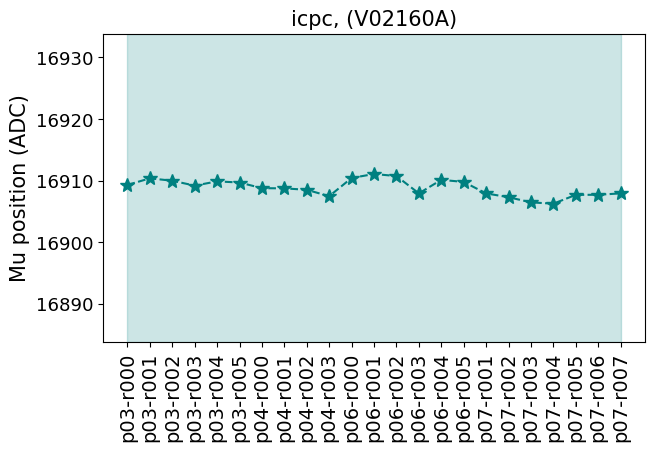

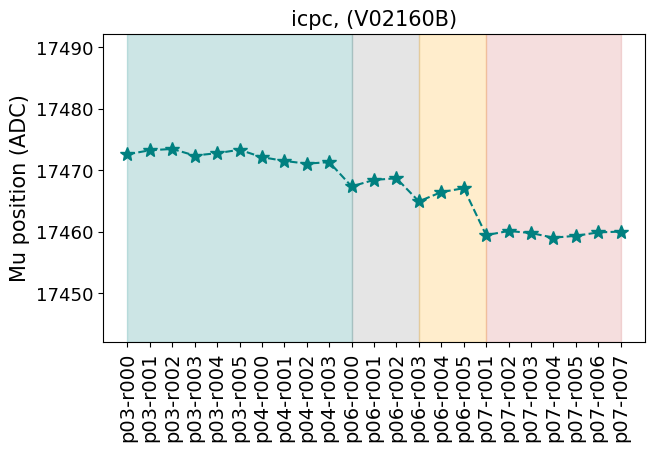

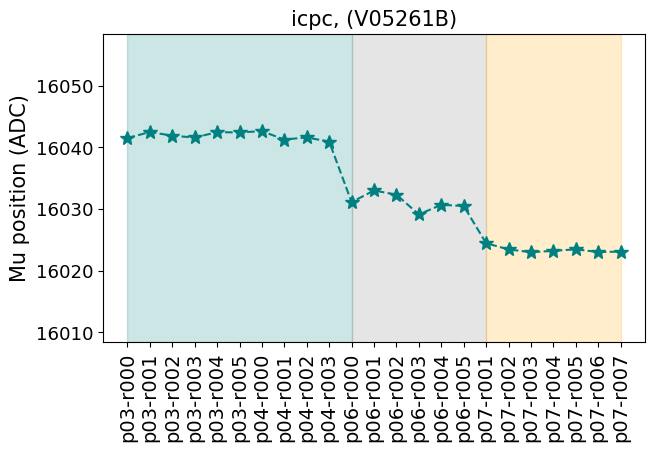

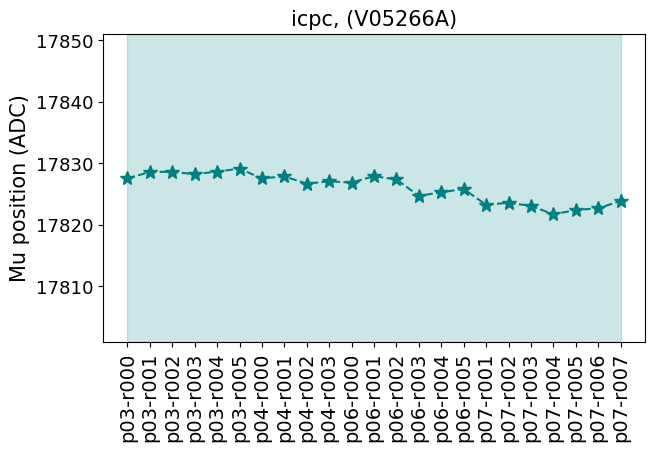

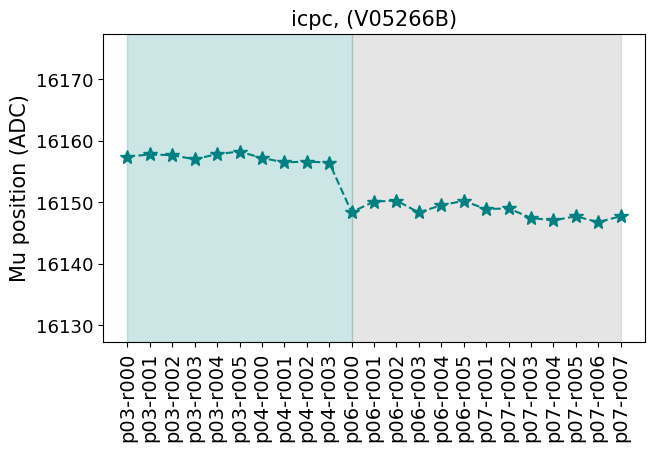

...

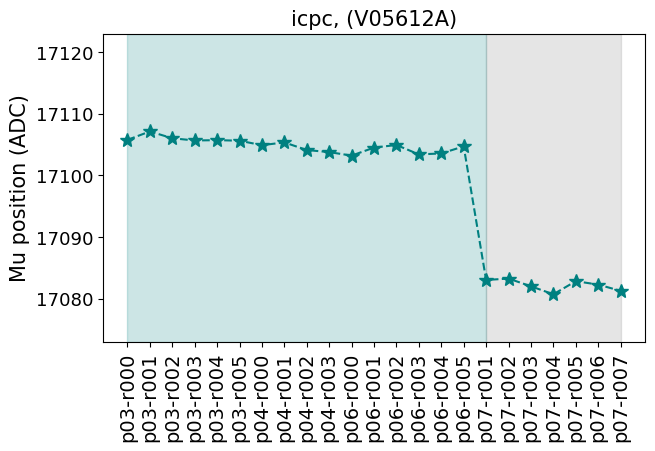

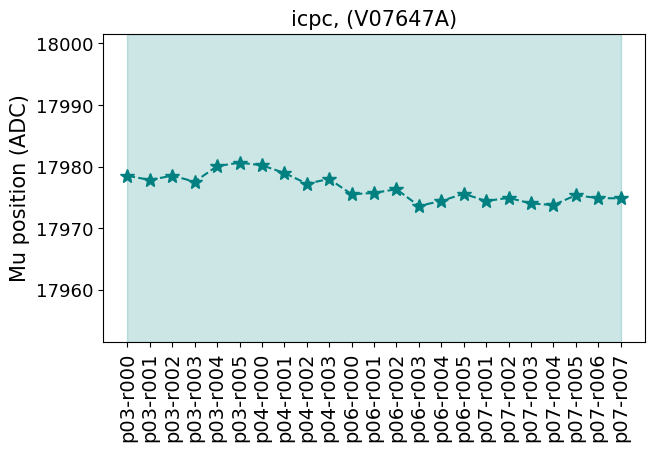

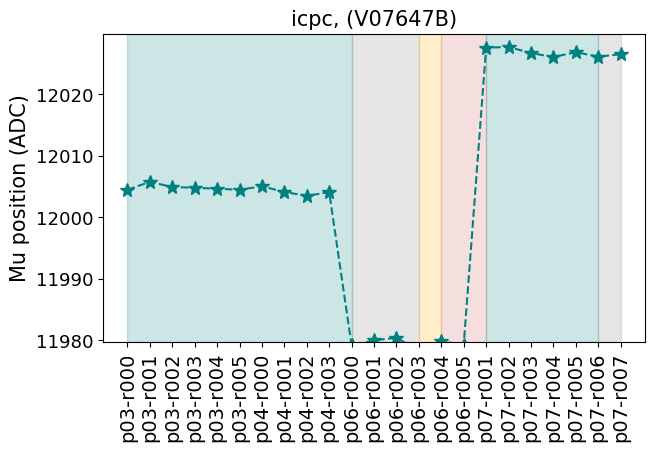

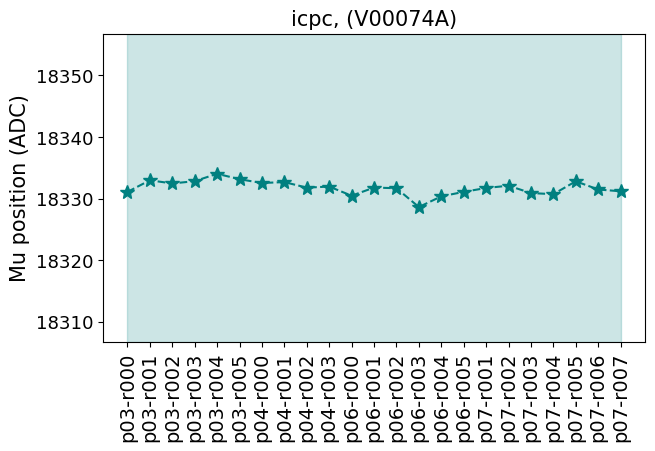

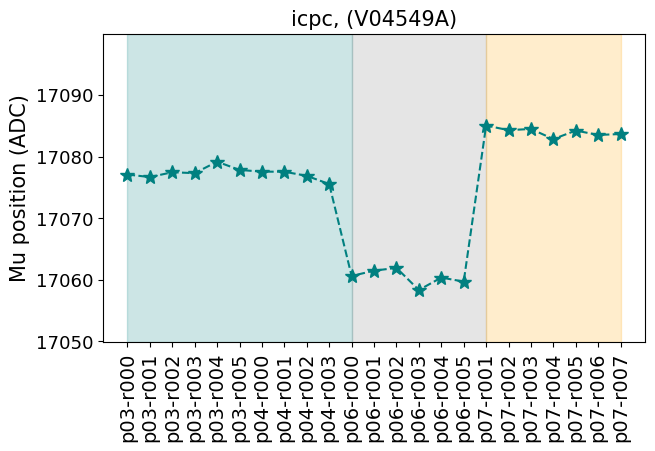

ch1108804
ch1115200
ch1115201
ch1115202


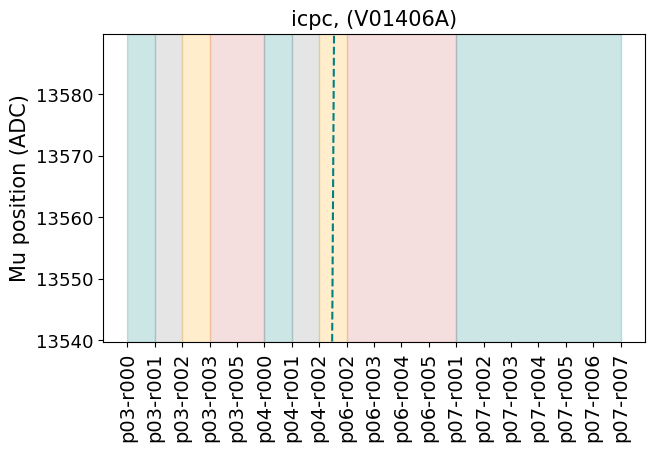

ch1115204


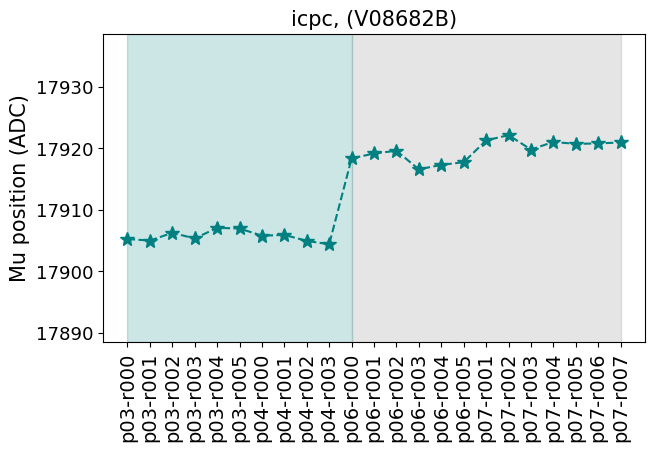

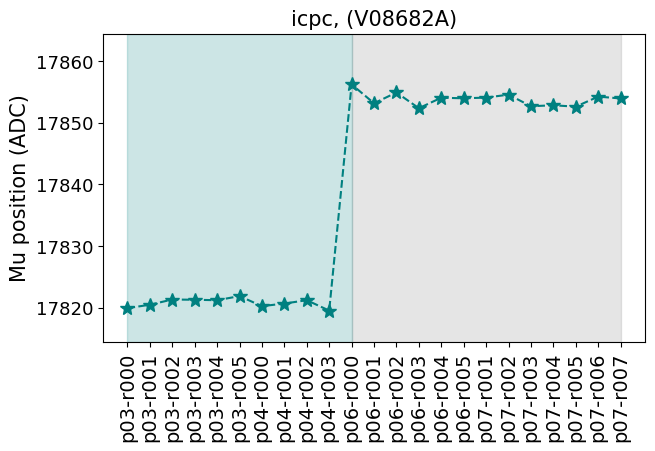

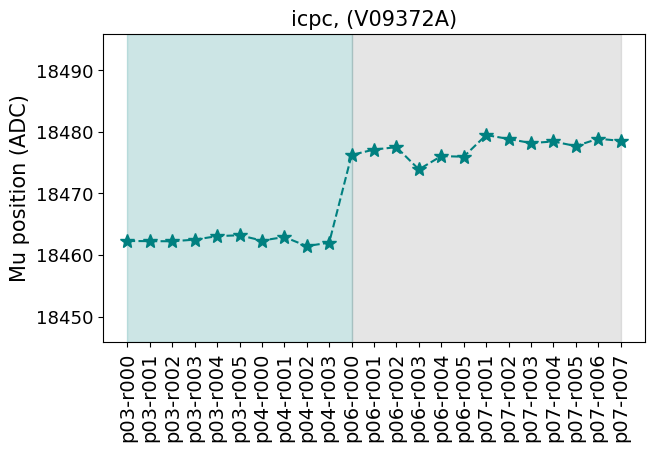

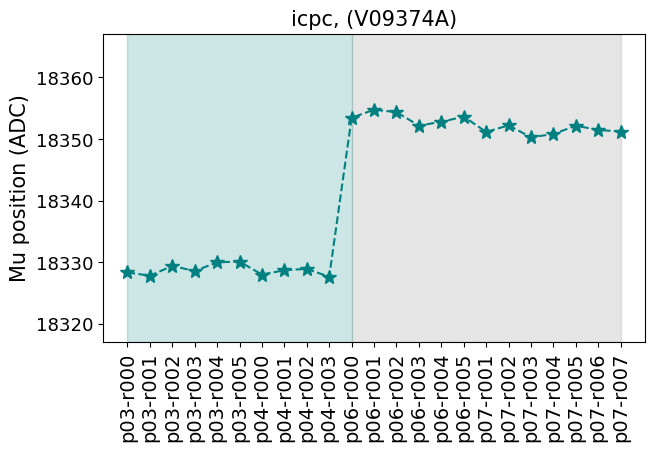

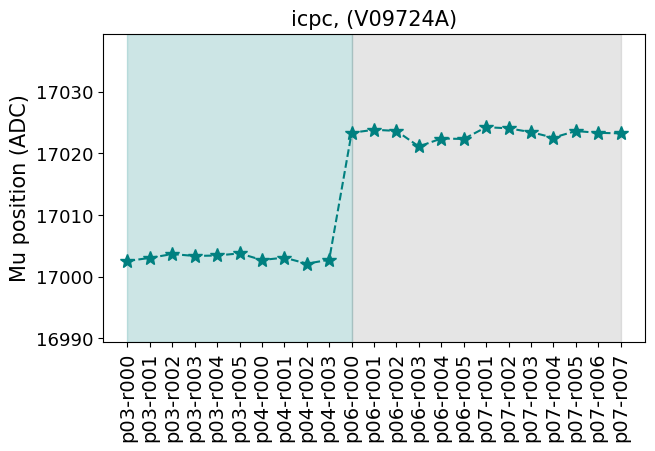

...

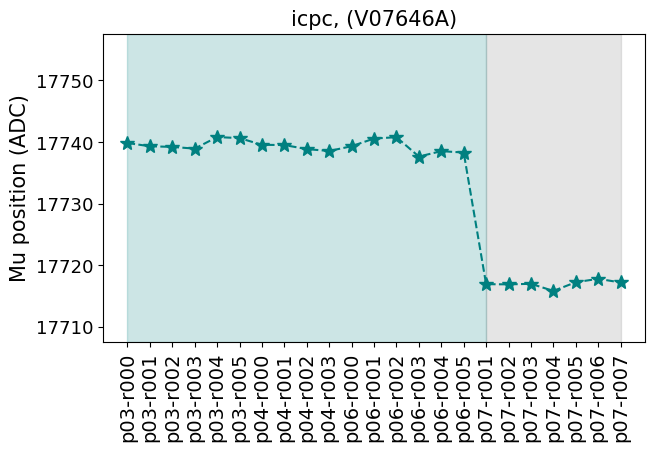

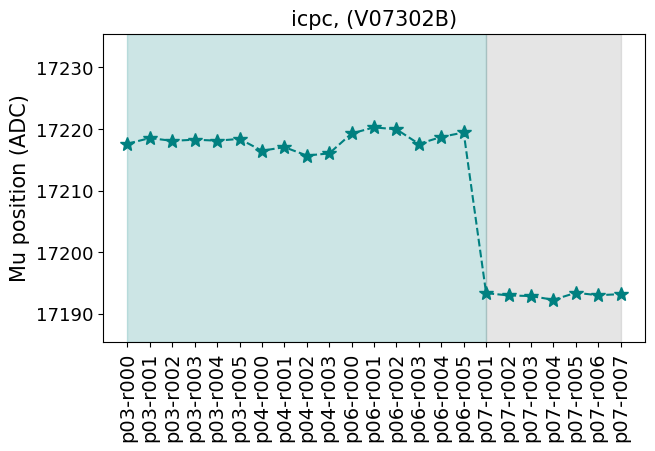

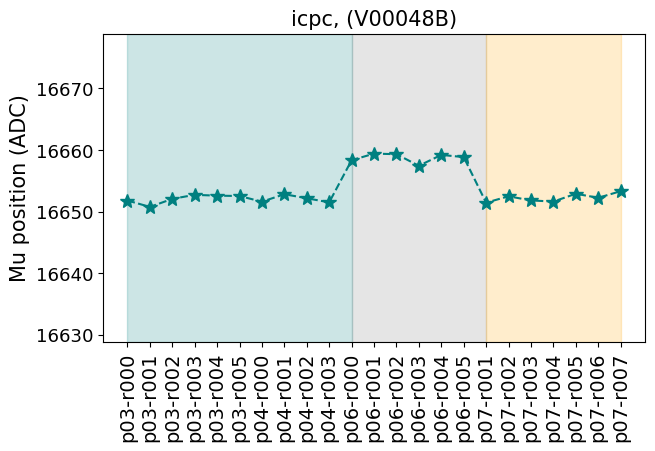

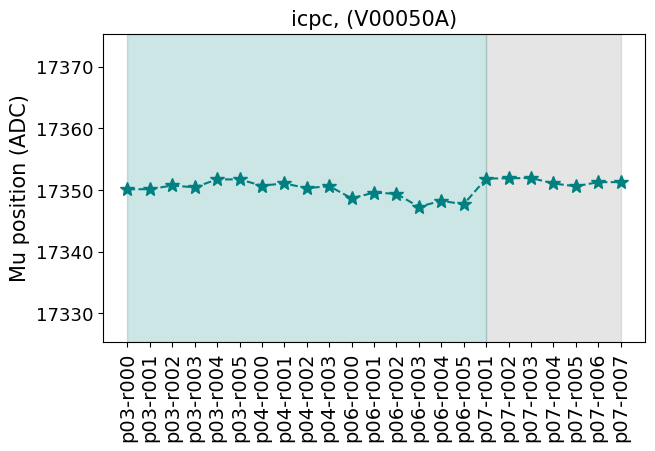

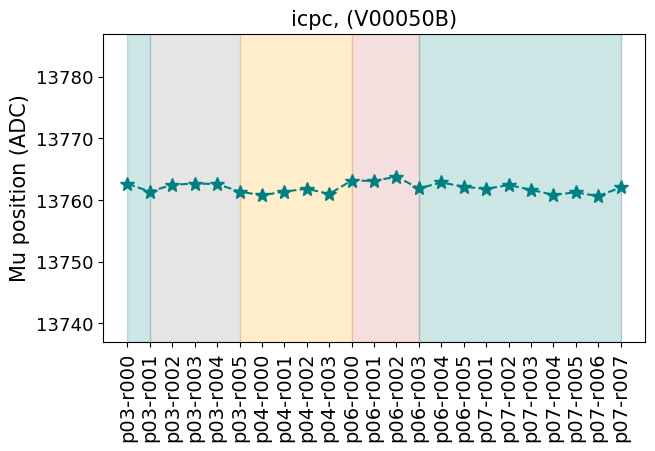

ch1121603


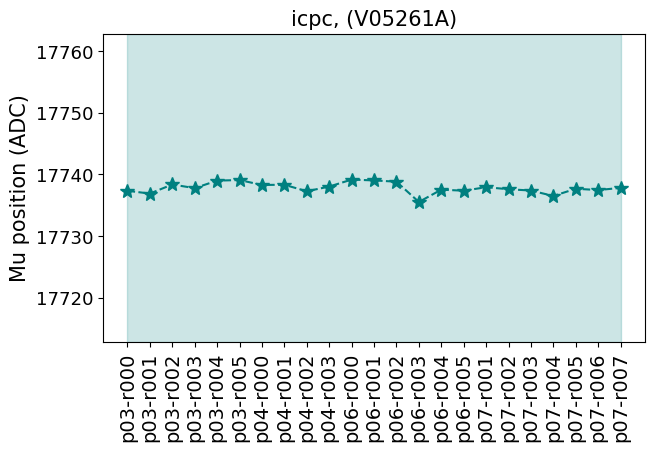

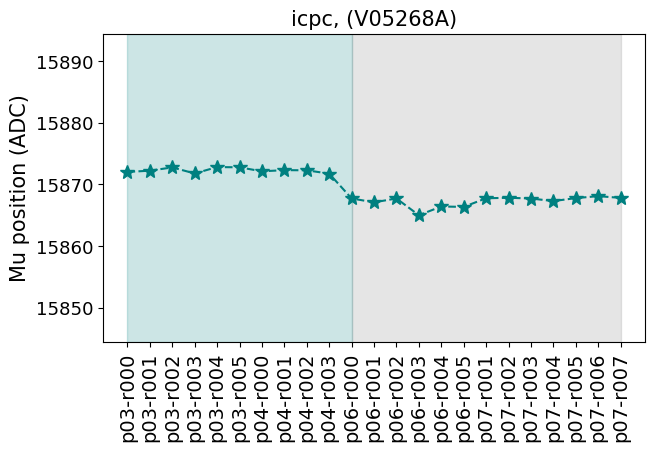

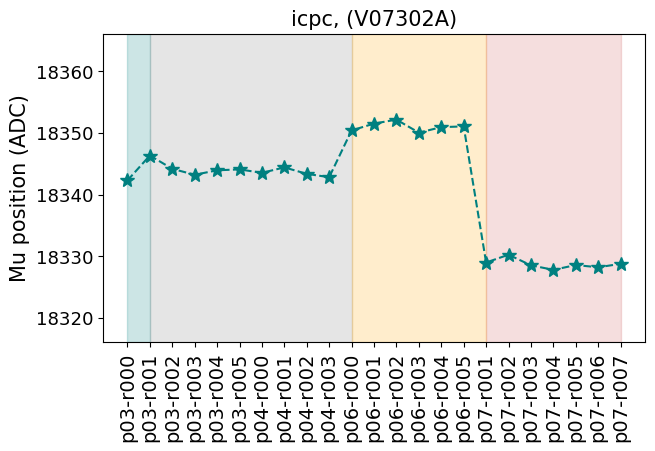

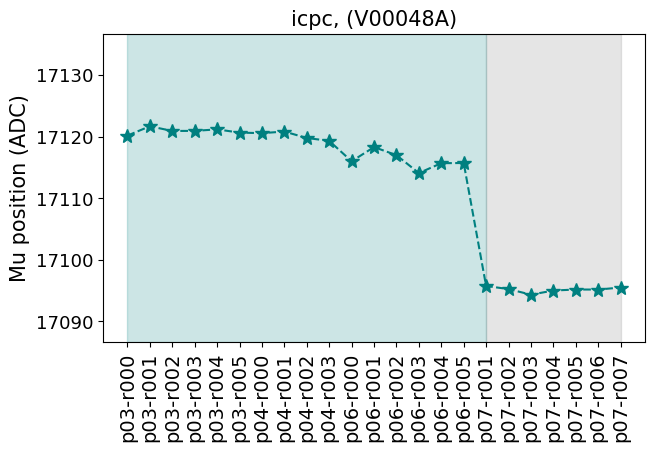

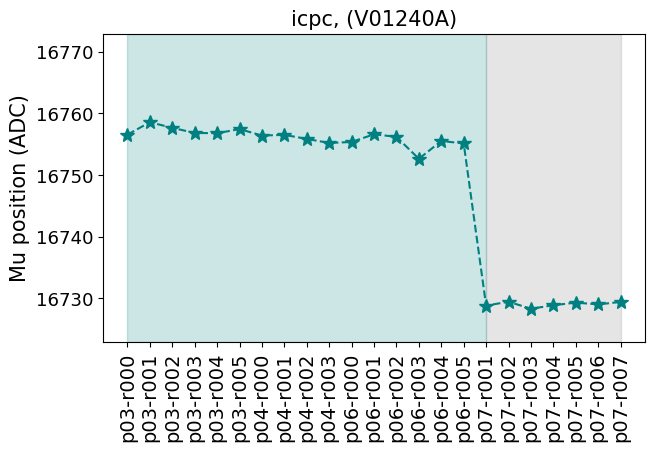

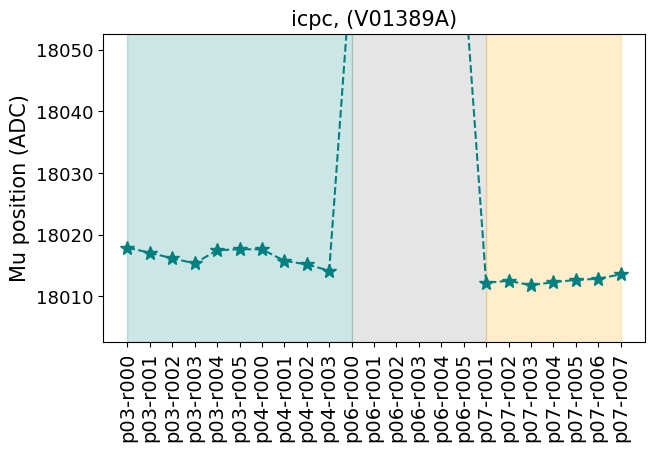

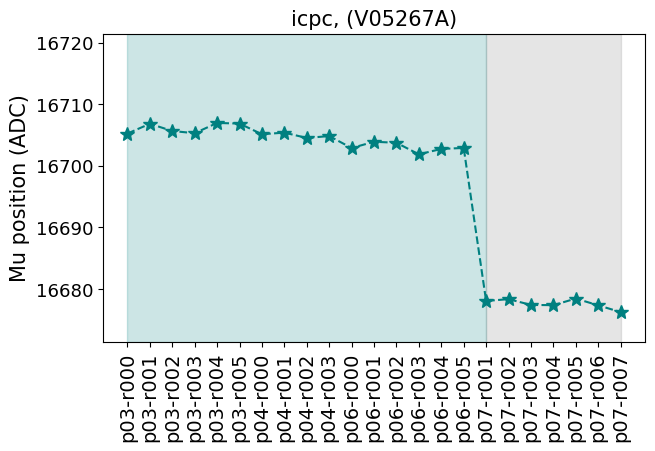

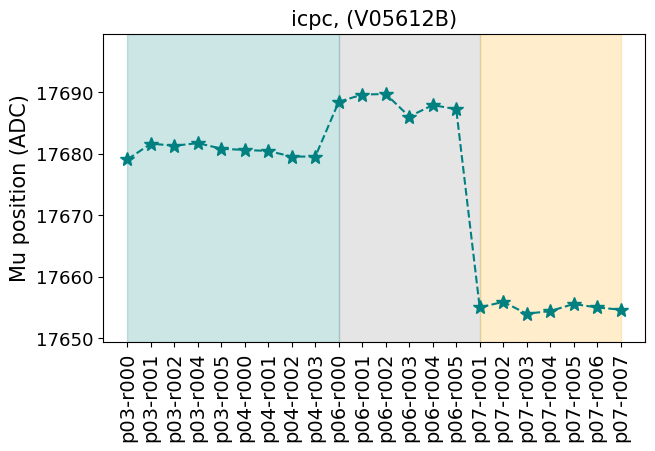

In [28]:
for channel in all_params_ch.keys():
    try:
        compute_and_plot_partition(channel, all_fitted_peaks[6])
    except KeyError:
        print(channel)
        continue

ch1108804
ch1115200
ch1115201
ch1115202
ch1115204
ch1121603


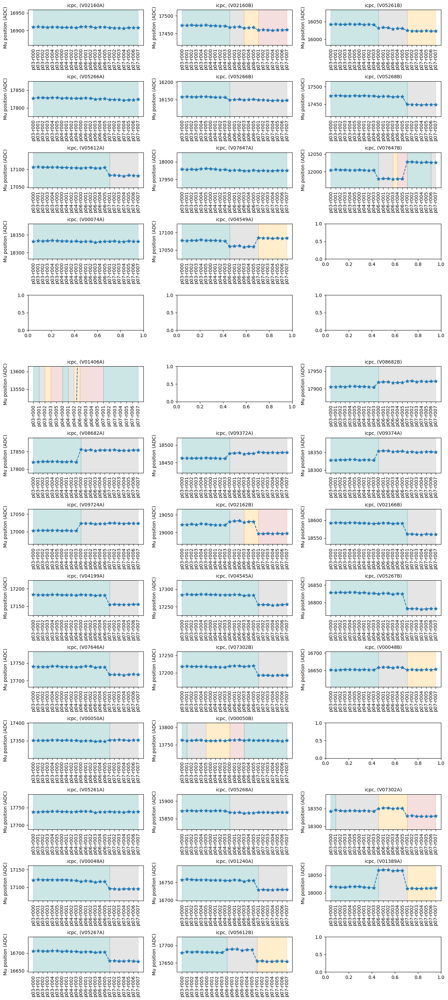

In [30]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0
        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.abs(sig):
                    partition_change.append(i)
                start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)

        color_list   = ['teal', 'grey', 'orange', 'indianred']
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax.set_ylabel('Mu position (ADC)', fontsize=10)
        ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
                    np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
    except KeyError:
        print(channel)
        continue
    
plt.tight_layout()    
plt.show()

In [31]:
good_channels = ['ch1104000', 'ch1104001', 'ch1104002', 'ch1104003', 'ch1104004', 'ch1104005', 'ch1105600',
                 'ch1105602', 'ch1105603', 'ch1108802', 'ch1108803', 'ch1115203', 'ch1116801', 'ch1116802',
                 'ch1116803', 'ch1116804', 'ch1116805', 'ch1118402', 'ch1118403', 'ch1118404', 'ch1118405',
                 'ch1120000', 'ch1120001', 'ch1120002', 'ch1121600', 'ch1121601', 'ch1121602', 'ch1121604',
                 'ch1121605', 'ch1078400', 'ch1084803', 'ch1084804', 'ch1084805', 'ch1086400', 'ch1086401']

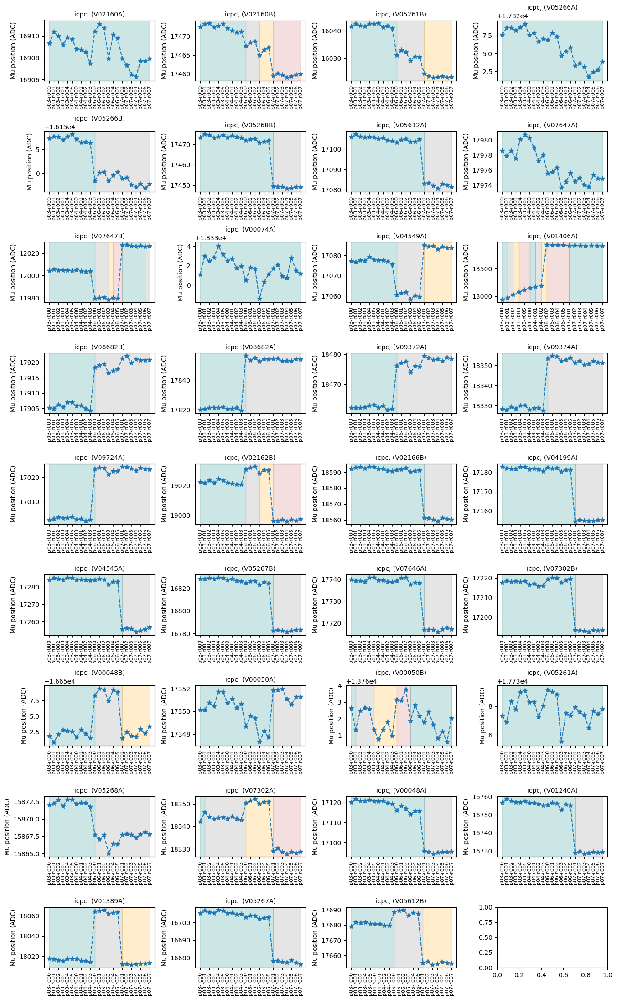

In [32]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(good_channels)/4)), 4, figsize=(13.5, 22))
for i, (ax, channel) in enumerate(zip(axs.flatten(), good_channels)):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0
        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.abs(sig):
                    partition_change.append(i)
                start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=8, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax.set_ylabel('Mu position (ADC)', fontsize=10)
        #ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
        #            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
    except KeyError:
        #print(channel)
        continue
    
plt.tight_layout()    
plt.show()

### Doubtful channels

In [33]:
for i,k in enumerate(all_params_ch.keys()):
    if i==35:
        print(k)

ch1078400


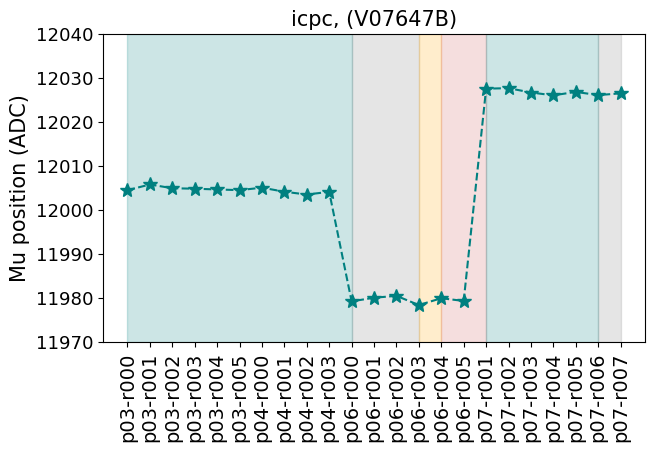

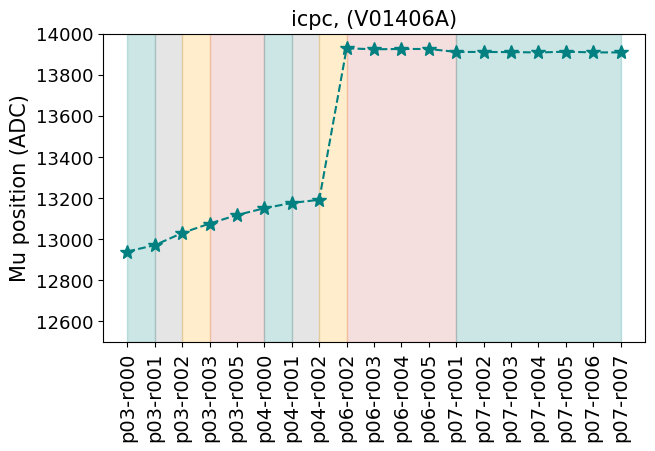

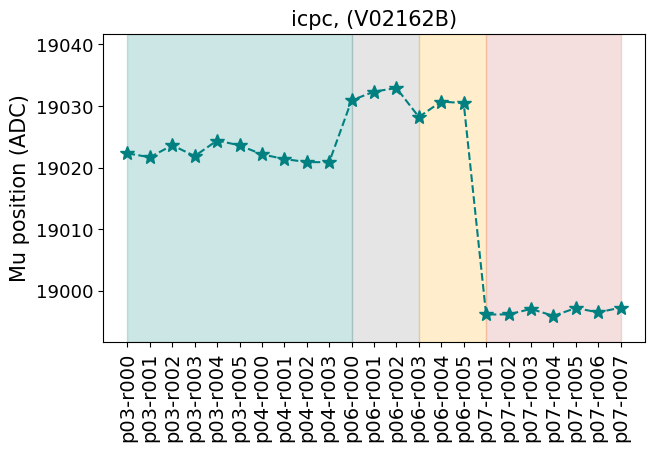

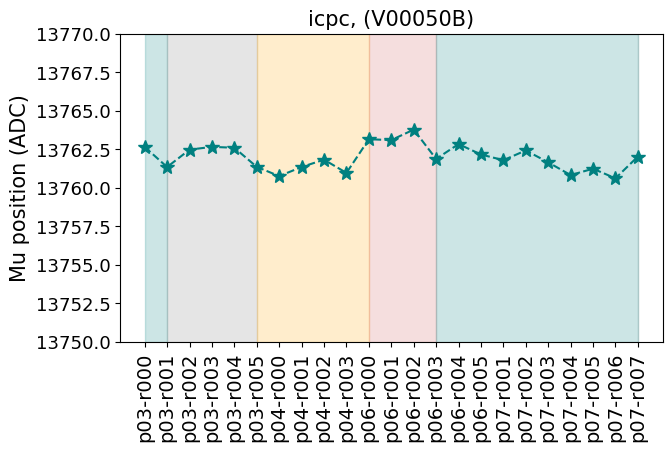

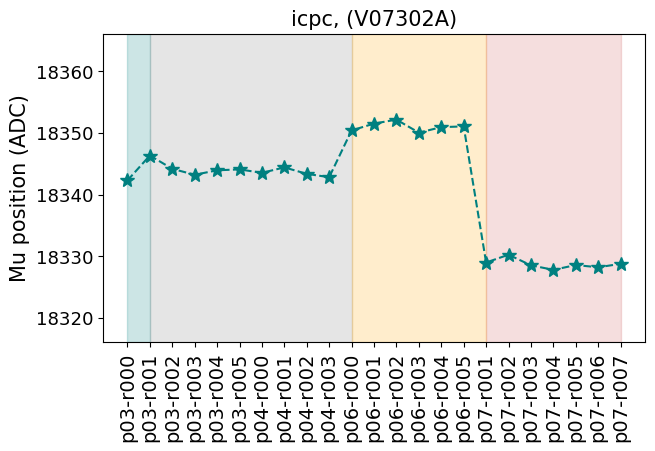

In [34]:
compute_and_plot_partition('ch1105603', all_fitted_peaks[6], ylim=(11970, 12040))
compute_and_plot_partition('ch1115203', all_fitted_peaks[6], ylim=(12500, 14000))
compute_and_plot_partition('ch1118402', all_fitted_peaks[6])
compute_and_plot_partition('ch1121602', all_fitted_peaks[6], ylim=(13750, 13770))
compute_and_plot_partition('ch1078400', all_fitted_peaks[6])

ch1108804
ch1115200
ch1115201
ch1115202
ch1115203
ch1115204
ch1121603
ch1086401


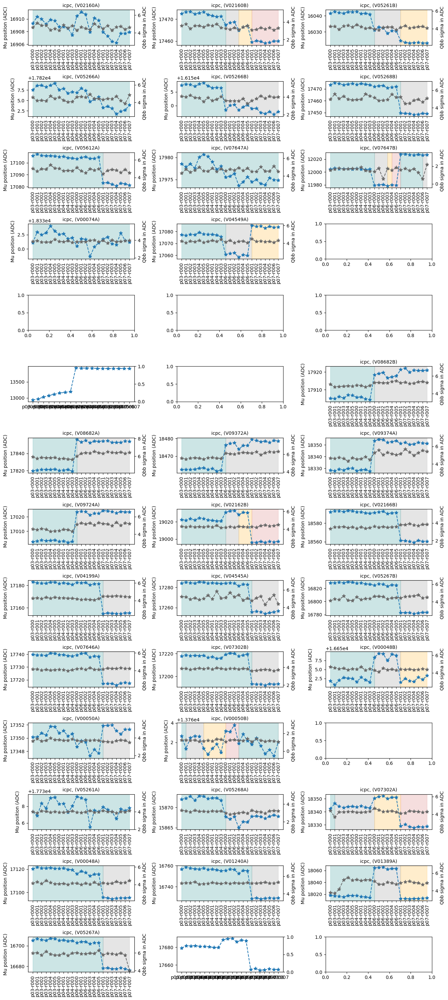

In [35]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0

        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.abs(sig):
                    partition_change.append(i)
                start_mu = mu
        #for i,mu in enumerate(mus):
        #    if i==0:
        #        start_mu = mu
        #    else:
        #        if np.abs(mu - start_mu) > np.mean(sigmas):
        #            partition_change.append(i)
        #        start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)
        ax2 = ax.twinx()
        ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     sigmas, marker='*', linestyle='--', markersize=8, color='dimgrey')
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax .set_ylabel('Mu position (ADC)', fontsize=10)
        ax2.set_ylabel('Qbb sigma in ADC',  fontsize=10)
        #ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
        #            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
        ax2.set_ylim(np.mean(sigmas)-2, np.mean(sigmas)+2)
    except KeyError:
        print(channel)
        continue
    except ValueError:
        print(channel)
        continue
    
plt.tight_layout()    
plt.show()

[0, 10, 13, 14, 16, 21, 22] [0, 10, 13, 16, 22]


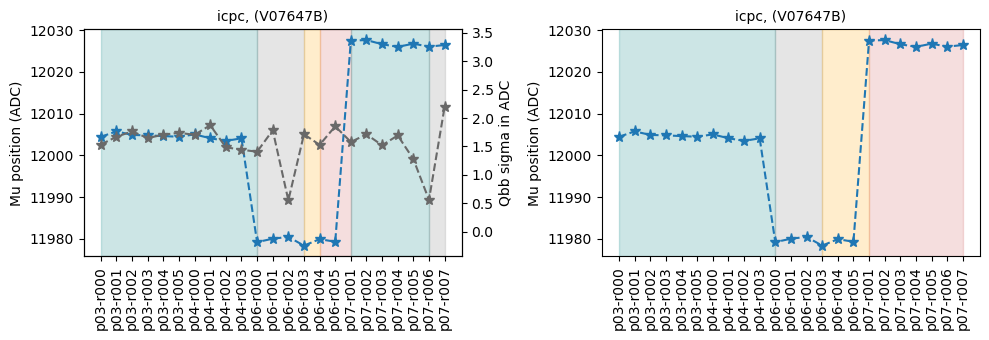

ch1108804
ch1115200
ch1115201
ch1115202
ch1115203
ch1115204
ch1121603
[0, 1, 10, 16, 22] [0, 10, 16, 22]


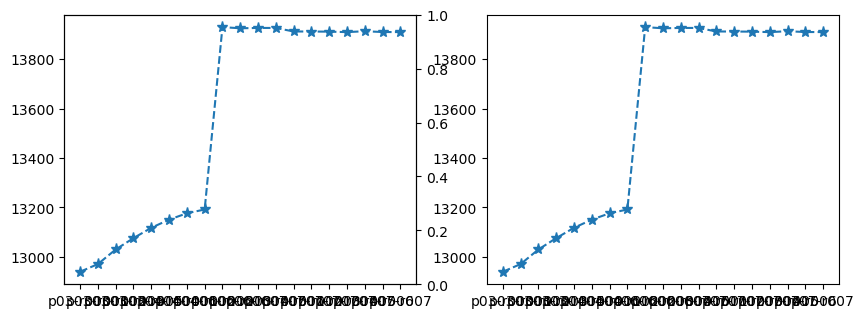

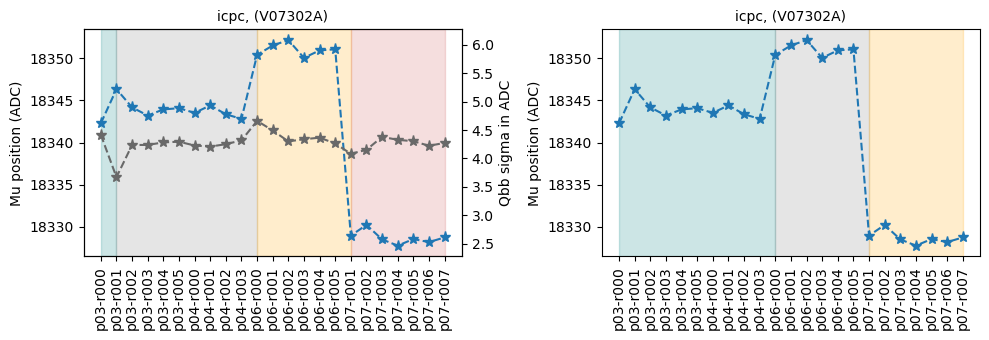

ch1086401


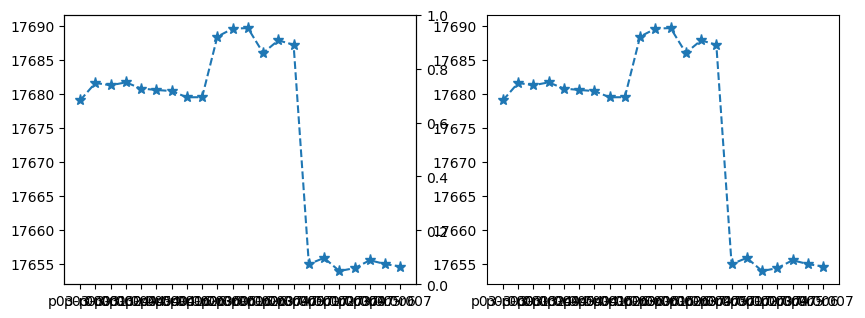

In [36]:
peak = all_fitted_peaks[6]
for i, channel in enumerate(all_params_ch.keys()):
    #if i>1:
    #    continue
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change0 = [0]
        partition_change1 = [0]
        start_mu0 = 0
        start_mu1 = 0

        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu0 = mu
            else:
                if np.abs(mu - start_mu0) > np.abs(sig):
                    partition_change0.append(i)
                start_mu0 = mu
        partition_change0.append(len(mus)-1)
        for i,mu in enumerate(mus):
            if i==0:
                start_mu1 = mu
            else:
                if np.abs(mu - start_mu1) > np.mean(sigmas):
                    partition_change1.append(i)
                start_mu1 = mu
        partition_change1.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        
        if partition_change0 == partition_change1:
            continue
        fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 3.5))
        ax0.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     list(all_params_ch[channel]['mus_peaks'][peak].values()),
                     yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                     marker='*', linestyle='--', markersize=8, label=det_type)
        ax1.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     list(all_params_ch[channel]['mus_peaks'][peak].values()),
                     yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                     marker='*', linestyle='--', markersize=8, label=det_type)
        ax2 = ax0.twinx()
        ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     sigmas, marker='*', linestyle='--', markersize=8, color='dimgrey')

        print(partition_change0, partition_change1)
        for i,col in zip(range(len(partition_change0)-1), cycle(color_list)):
            ax0.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change0[i]], 
                        list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change0[i+1]], alpha=0.2, color=col)
        for i,col in zip(range(len(partition_change1)-1), cycle(color_list)):
            ax1.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change1[i]], 
                        list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change1[i+1]], alpha=0.2, color=col)
        ax0.tick_params(axis='x', labelsize=10, rotation=90)
        ax0.tick_params(axis='y', labelsize=10)
        ax0.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax0 .set_ylabel('Mu position (ADC)', fontsize=10)
        ax1.tick_params(axis='x', labelsize=10, rotation=90)
        ax1.tick_params(axis='y', labelsize=10)
        ax1.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax1 .set_ylabel('Mu position (ADC)', fontsize=10)
        ax2.set_ylabel('Qbb sigma in ADC',  fontsize=10)
        #ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
        #            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
        ax2.set_ylim(np.mean(sigmas)-2, np.mean(sigmas)+2)
    except KeyError:
        print(channel)
        continue
    except ValueError:
        print(channel)
        continue
    plt.tight_layout()    
    plt.show()